In [2]:
import numpy as np
import matplotlib.pyplot as plt
import librosa
import librosa.display
import os
import pandas as pd
import scipy.signal
import pickle

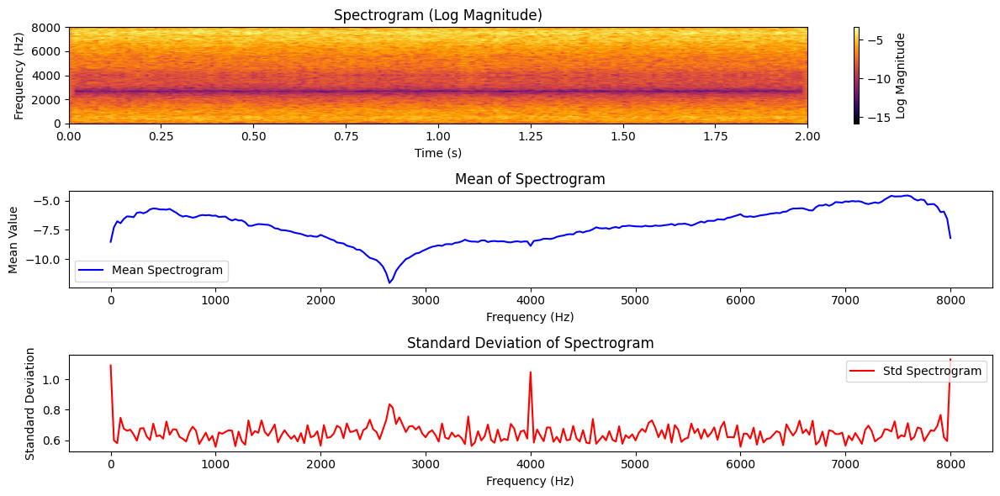

In [3]:
file_path = r"C:\Users\Admin\Documents\Python Project\bee-swarming\SB1\buzz 1\Test\None_swarming\bee sound\39115_B00002_Thu Apr 04 2024_1.wav"
y, sr = librosa.load(file_path, sr=None)

pre_emphasis = 0.98
emphasized_signal = np.append(y[0], y[1:] - pre_emphasis * y[:-1])

frame_size = 0.025
frame_stride = 0.01
n_fft = 512
hop_length = 128
frequencies, times, Zxx = scipy.signal.stft(emphasized_signal, fs=sr, nperseg=n_fft, noverlap=n_fft - hop_length, window="hann")

magnitude_spectrogram = np.abs(Zxx)
log_magnitude_spectrogram = np.log(magnitude_spectrogram + 1e-10)

mean_spectrogram = np.mean(log_magnitude_spectrogram, axis=1) 
std_spectrogram = np.std(log_magnitude_spectrogram, axis=1)

plt.figure(figsize=(12, 6))

plt.subplot(3, 1, 1)
plt.imshow(log_magnitude_spectrogram, aspect='auto', cmap='inferno', origin='lower',
           extent=[times.min(), times.max(), frequencies.min(), frequencies.max()])
plt.colorbar(label="Log Magnitude")
plt.xlabel("Time (s)")
plt.ylabel("Frequency (Hz)")
plt.title("Spectrogram (Log Magnitude)")

plt.subplot(3, 1, 2)
plt.plot(frequencies, mean_spectrogram, label="Mean Spectrogram", color='b')
plt.xlabel("Frequency (Hz)")
plt.ylabel("Mean Value")
plt.title("Mean of Spectrogram")
plt.legend()

plt.subplot(3, 1, 3)
plt.plot(frequencies, std_spectrogram, label="Std Spectrogram", color='r')
plt.xlabel("Frequency (Hz)")
plt.ylabel("Standard Deviation")
plt.title("Standard Deviation of Spectrogram")
plt.legend()

plt.tight_layout()
plt.show()


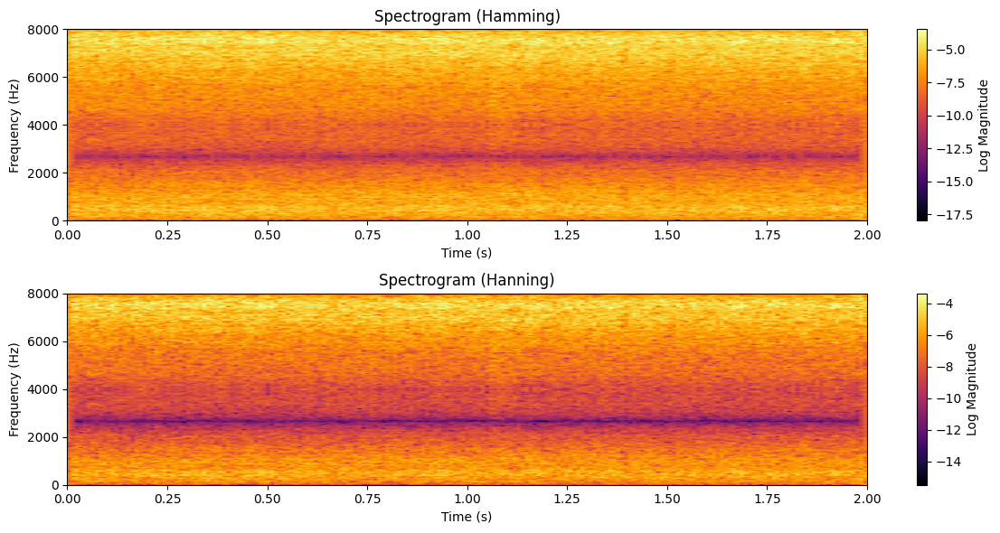

In [4]:
import numpy as np
import librosa
import scipy.signal
import matplotlib.pyplot as plt

# Load file âm thanh
file_path = r"C:\Users\Admin\Documents\Python Project\bee-swarming\SB1\buzz 1\Test\None_swarming\bee sound\39115_B00002_Thu Apr 04 2024_1.wav"
y, sr = librosa.load(file_path, sr=None)

# Tiền xử lý tín hiệu (Pre-emphasis)
pre_emphasis = 0.98
emphasized_signal = np.append(y[0], y[1:] - pre_emphasis * y[:-1])

# Các tham số STFT
frame_size = 0.025
frame_stride = 0.01 
n_fft = 512
hop_length = int(frame_stride * sr)

# Tính STFT với Hamming
frequencies_hamming, times_hamming, Zxx_hamming = scipy.signal.stft(
    emphasized_signal, fs=sr, nperseg=n_fft, noverlap=n_fft - hop_length, window="hamming"
)

# Tính STFT với Hanning
frequencies_hanning, times_hanning, Zxx_hanning = scipy.signal.stft(
    emphasized_signal, fs=sr, nperseg=n_fft, noverlap=n_fft - hop_length, window="hann"
)

# Chuyển về log-magnitude
log_magnitude_hamming = np.log(np.abs(Zxx_hamming) + 1e-10)
log_magnitude_hanning = np.log(np.abs(Zxx_hanning) + 1e-10)

# Vẽ đồ thị so sánh
plt.figure(figsize=(12, 6))

plt.subplot(2, 1, 1)
plt.imshow(log_magnitude_hamming, aspect='auto', cmap='inferno', origin='lower',
           extent=[times_hamming.min(), times_hamming.max(), frequencies_hamming.min(), frequencies_hamming.max()])
plt.colorbar(label="Log Magnitude")
plt.xlabel("Time (s)")
plt.ylabel("Frequency (Hz)")
plt.title("Spectrogram (Hamming)")

plt.subplot(2, 1, 2)
plt.imshow(log_magnitude_hanning, aspect='auto', cmap='inferno', origin='lower',
           extent=[times_hanning.min(), times_hanning.max(), frequencies_hanning.min(), frequencies_hanning.max()])
plt.colorbar(label="Log Magnitude")
plt.xlabel("Time (s)")
plt.ylabel("Frequency (Hz)")
plt.title("Spectrogram (Hanning)")

plt.tight_layout()
plt.show()


In [5]:
print("Shape of Spectrogram (Log Magnitude):", log_magnitude_spectrogram.shape)
print("Shape of Spectrogram (Magnitude):", magnitude_spectrogram.shape)

Shape of Spectrogram (Log Magnitude): (257, 251)
Shape of Spectrogram (Magnitude): (257, 251)


In [6]:
from tqdm import tqdm
import glob

In [7]:
def extract_stft(file_path, frame_size=0.05, frame_stride=0.02, n_fft=512):
    try:
        y, sr = librosa.load(file_path, sr=None)

        pre_emphasis = 0.97
        emphasized_signal = np.append(y[0], y[1:] - pre_emphasis * y[:-1])

        hop_length = int(frame_stride * sr)
        frequencies, times, Zxx = scipy.signal.stft(emphasized_signal, fs=sr, nperseg=n_fft, noverlap=n_fft - hop_length, window="hann")

        magnitude_spectrogram = np.abs(Zxx)

        log_magnitude_spectrogram = np.log(magnitude_spectrogram + 1e-10)

        return log_magnitude_spectrogram, None

    except Exception as e:
        return None, str(e)

def extract_features_from_folder(root_folder):
    all_data = []
    errors = []

    for dirpath, _, filenames in os.walk(root_folder):
        for file in tqdm(filenames, desc=f"Processing {dirpath}", leave=False):
            if file.endswith(('.wav', '.mp3')):
                file_path = os.path.join(dirpath, file)
                relative_path = os.path.relpath(file_path, root_folder)
                parts = relative_path.split(os.sep)

                category = parts[0] if len(parts) > 0 else "Unknown"
                subcategory = parts[1] if len(parts) > 1 else "Unknown"

                stft, error = extract_stft(file_path)
                if stft is not None:
                    feature_row = {
                        'file_name': file,
                        'category': category,
                        'subcategory': subcategory,
                        'stft': stft 
                    }
                    all_data.append(feature_row)
                else:
                    errors.append((file_path, error))

    return all_data, errors

def save_to_pickle(data, output_file):
    with open(output_file, 'wb') as f:
        pickle.dump(data, f)

if __name__ == "__main__":
    root_folder = r"C:\Users\Admin\Documents\Python Project\bee-swarming\SB1\buzz 1" 
    output_folder = r"C:\Users\Admin\Documents\Python Project\bee-swarming\STFT ver 2.0\STFT_features_buzz1"
    
    os.makedirs(output_folder, exist_ok=True)

    for subset in ["Test", "Train", "Val"]:
        subset_path = os.path.join(root_folder, subset)
        print(f"Processing {subset_path}...")

        features_data, errors = extract_features_from_folder(subset_path)

        output_file = os.path.join(output_folder, f"{subset}_stft_features.pkl")
        save_to_pickle(features_data, output_file)
        print(f"Saved features for {subset} to {output_file}")

        if errors:
            error_log_file = os.path.join(output_folder, f"{subset}_errors.log")
            with open(error_log_file, "w", encoding="utf-8") as f:
                for file_path, error in errors:
                    f.write(f"{file_path}: {error}\n")
            print(f"Logged errors for {subset} in {error_log_file}")


Processing C:\Users\Admin\Documents\Python Project\bee-swarming\SB1\buzz 1\Test...


Saved features for Test to C:\Users\Admin\Documents\Python Project\bee-swarming\STFT ver 2.0\STFT_features_buzz1\Test_stft_features.pkl
Processing C:\Users\Admin\Documents\Python Project\bee-swarming\SB1\buzz 1\Train...


Saved features for Train to C:\Users\Admin\Documents\Python Project\bee-swarming\STFT ver 2.0\STFT_features_buzz1\Train_stft_features.pkl
Processing C:\Users\Admin\Documents\Python Project\bee-swarming\SB1\buzz 1\Val...


Saved features for Val to C:\Users\Admin\Documents\Python Project\bee-swarming\STFT ver 2.0\STFT_features_buzz1\Val_stft_features.pkl


In [8]:
pickle_file_path = r"C:\Users\Admin\Documents\Python Project\bee-swarming\STFT ver 2.0\STFT_features_buzz1\Train_stft_features.pkl"

with open(pickle_file_path, 'rb') as f:
    data = pickle.load(f)

print(data)


[{'file_name': '08_06_21_board2_Tha chua dang nhot_0.wav', 'category': 'None_swarming', 'subcategory': '08_06_21_board2_Tha chua dang nhot', 'stft': array([[-11.133466 , -12.912004 , -13.136182 , ..., -13.828479 ,
        -10.755098 , -10.877785 ],
       [-11.212568 , -11.028774 , -11.7055   , ..., -10.44008  ,
        -10.410292 , -10.741357 ],
       [-10.723996 , -10.033154 , -10.275673 , ...,  -9.600488 ,
        -10.235161 , -10.515964 ],
       ...,
       [-11.6455765, -11.816464 , -12.185985 , ..., -12.232391 ,
        -12.230503 , -13.043742 ],
       [-11.704257 , -12.037445 , -12.496281 , ..., -11.866193 ,
        -14.328735 , -12.945314 ],
       [-13.93581  , -11.836581 , -12.880582 , ..., -11.890429 ,
        -13.453776 , -12.846132 ]], dtype=float32)}, {'file_name': '08_06_21_board2_Tha chua dang nhot_10.wav', 'category': 'None_swarming', 'subcategory': '08_06_21_board2_Tha chua dang nhot', 'stft': array([[-11.315264 , -12.090031 , -10.43199  , ..., -11.053028 ,
       

In [9]:
if __name__ == "__main__":
    root_folder = r"C:\Users\Admin\Documents\Python Project\bee-swarming\SB2\buzz 2" 
    output_folder = r"C:\Users\Admin\Documents\Python Project\bee-swarming\STFT ver 2.0\STFT_features_buzz2"
    
    os.makedirs(output_folder, exist_ok=True)

    for subset in ["Test", "Train", "Val"]:
        subset_path = os.path.join(root_folder, subset)
        print(f"Processing {subset_path}...")

        features_data, errors = extract_features_from_folder(subset_path)

        output_file = os.path.join(output_folder, f"{subset}_stft_features.pkl")
        save_to_pickle(features_data, output_file)
        print(f"Saved features for {subset} to {output_file}")

        if errors:
            error_log_file = os.path.join(output_folder, f"{subset}_errors.log")
            with open(error_log_file, "w", encoding="utf-8") as f:
                for file_path, error in errors:
                    f.write(f"{file_path}: {error}\n")
            print(f"Logged errors for {subset} in {error_log_file}")


Processing C:\Users\Admin\Documents\Python Project\bee-swarming\SB2\buzz 2\Test...


Saved features for Test to C:\Users\Admin\Documents\Python Project\bee-swarming\STFT ver 2.0\STFT_features_buzz2\Test_stft_features.pkl
Processing C:\Users\Admin\Documents\Python Project\bee-swarming\SB2\buzz 2\Train...


Saved features for Train to C:\Users\Admin\Documents\Python Project\bee-swarming\STFT ver 2.0\STFT_features_buzz2\Train_stft_features.pkl
Processing C:\Users\Admin\Documents\Python Project\bee-swarming\SB2\buzz 2\Val...


Saved features for Val to C:\Users\Admin\Documents\Python Project\bee-swarming\STFT ver 2.0\STFT_features_buzz2\Val_stft_features.pkl
